In [1]:
pip install mediapipe opencv-python


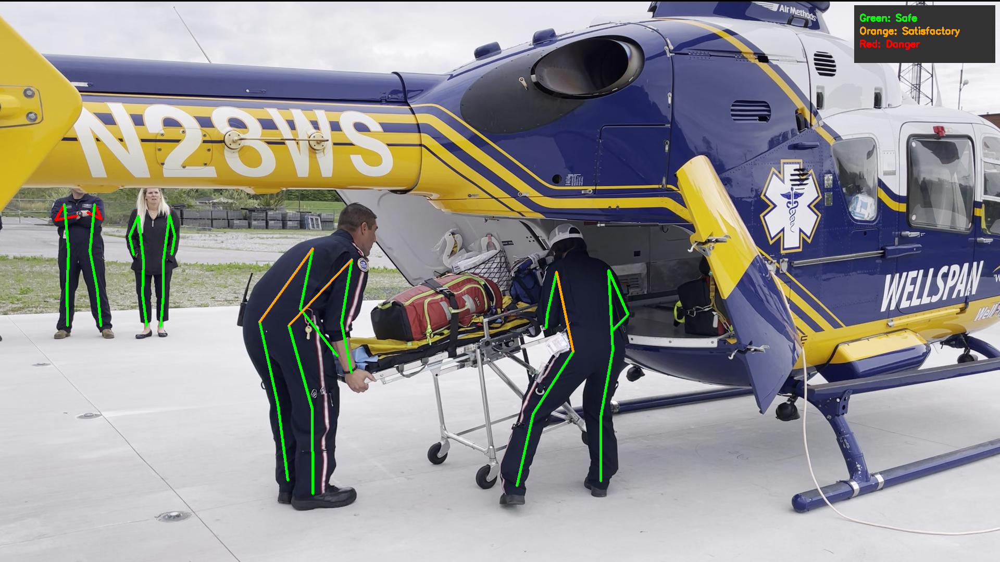

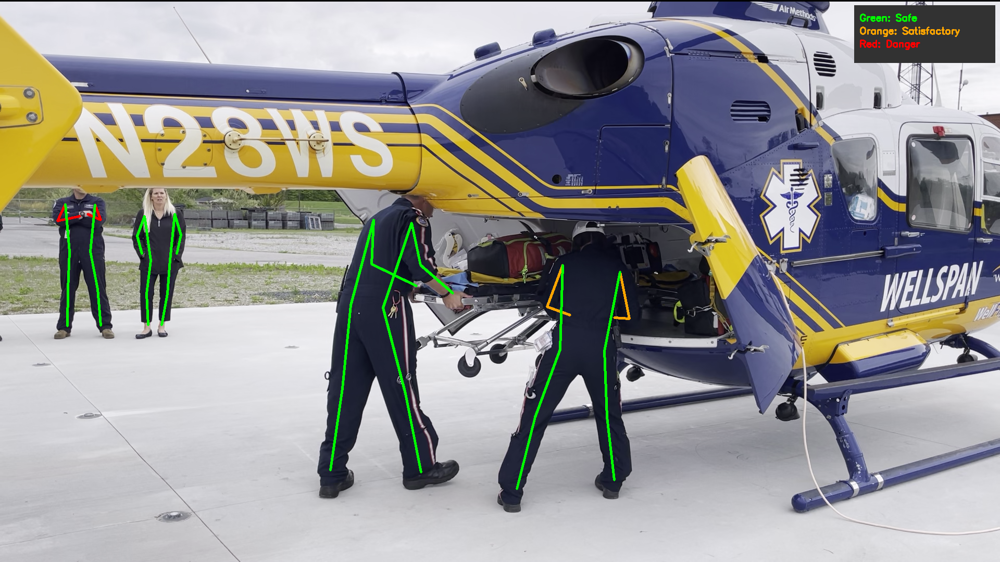

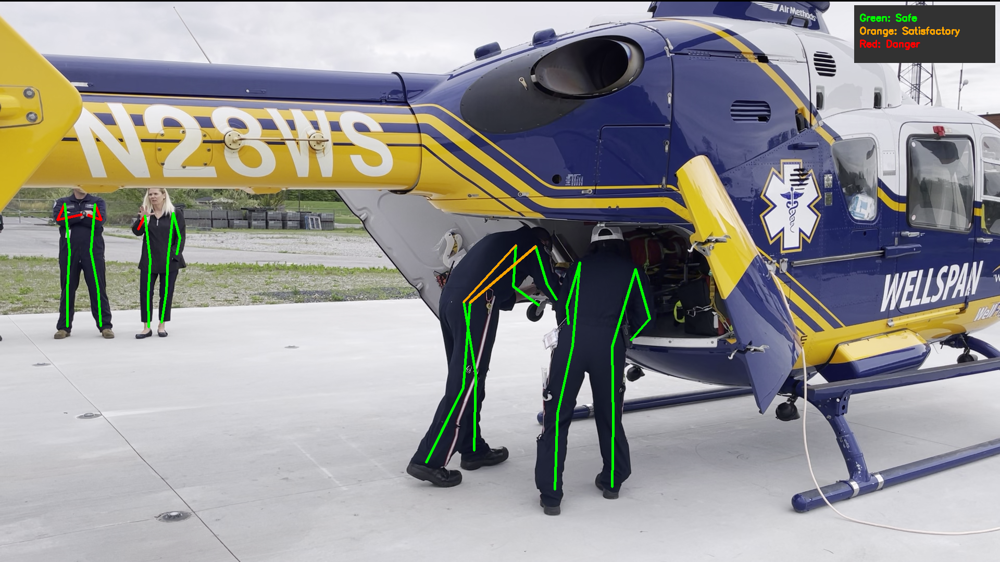

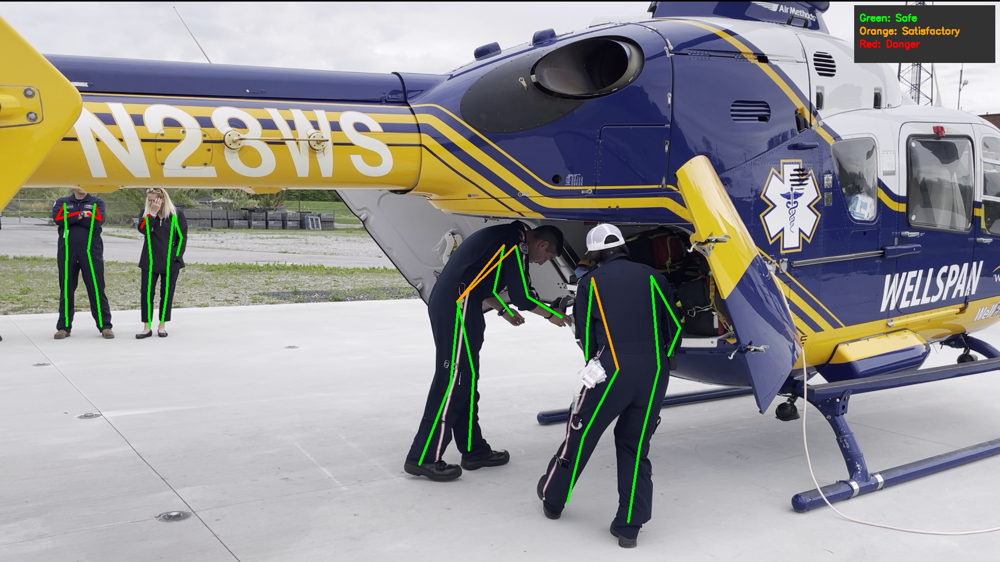

Multi-person posture detection complete! Saved as output_pose_multi_posture.mp4


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [3]:



!pip install ultralytics opencv-python

# Imports
from ultralytics import YOLO
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files

# Function to calculate angle between 3 points
def calculate_angle(a, b, c):
    a = np.array(a)
    b = np.array(b)
    c = np.array(c)
    ba = a - b
    bc = c - b
    cosine_angle = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc) + 1e-8)
    angle = np.arccos(np.clip(cosine_angle, -1.0, 1.0))
    return np.degrees(angle)

# Load YOLOv8-Pose model
model = YOLO("yolov8s-pose.pt")

# Load video
######################  your uploaded video ############################
video_path = "Add Video path here"
cap = cv2.VideoCapture(video_path)
width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps    = cap.get(cv2.CAP_PROP_FPS)

# Output video writer
out = cv2.VideoWriter("output_pose_multi_posture.mp4",
                      cv2.VideoWriter_fourcc(*"mp4v"),
                      fps, (width, height))


def draw_topright_legend(frame):
    # Set rectangle position (top-right)
    h, w = frame.shape[:2]
    x1, y1 = w - 280, 10
    x2, y2 = w - 10, 120
    cv2.rectangle(frame, (x1, y1), (x2, y2), (50,50,50), -1)  # dark background

    # Draw text
    cv2.putText(frame, "Green: Safe", (x1+10, y1+30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0),2)
    cv2.putText(frame, "Orange: Satisfactory", (x1+10, y1+55), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,165,255),2)
    cv2.putText(frame, "Red: Danger", (x1+10, y1+80), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,0,255),2)

frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Rotate frame
    frame = cv2.rotate(frame, cv2.ROTATE_180)

    # Draw top-right legend for every frame
    draw_topright_legend(frame)

    # Run pose detection
    results = model.predict(frame, verbose=False, imgsz=640, conf=0.3, iou=0.5)

    for r in results:
        if r.keypoints is not None:
            for person_id, person in enumerate(r.keypoints.xy, start=1):
                kps = [(int(x), int(y)) for x, y in person]


                # ----- ELBOWS -----
                left_elbow  = calculate_angle(kps[5], kps[7], kps[9])
                right_elbow = calculate_angle(kps[6], kps[8], kps[10])

                # ----- KNEES -----
                left_knee  = calculate_angle(kps[11], kps[13], kps[15])
                right_knee = calculate_angle(kps[12], kps[14], kps[16])

                # ----- BACK -----
                left_back  = calculate_angle(kps[5], kps[11], kps[13])
                right_back = calculate_angle(kps[6], kps[12], kps[14])

                # Draw skeleton lines
                def angle_color(angle, safe=90, warning=60):
                    if angle >= safe: return (0,255,0)
                    elif angle >= warning: return (0,165,255)
                    else: return (0,0,255)

                # Arms
                cv2.line(frame, kps[5], kps[7], angle_color(left_elbow), 3)
                cv2.line(frame, kps[7], kps[9], angle_color(left_elbow), 3)
                cv2.line(frame, kps[6], kps[8], angle_color(right_elbow), 3)
                cv2.line(frame, kps[8], kps[10], angle_color(right_elbow), 3)

                # Legs
                cv2.line(frame, kps[11], kps[13], angle_color(left_knee), 3)
                cv2.line(frame, kps[13], kps[15], angle_color(left_knee), 3)
                cv2.line(frame, kps[12], kps[14], angle_color(right_knee), 3)
                cv2.line(frame, kps[14], kps[16], angle_color(right_knee), 3)

                # Back
                cv2.line(frame, kps[5], kps[11], angle_color(left_back, safe=140, warning=120), 3)
                cv2.line(frame, kps[6], kps[12], angle_color(right_back, safe=140, warning=120), 3)

    # Write every frame
    out.write(frame)

    frame_count += 1
    if frame_count % 50 == 0:
        cv2_imshow(frame)


cap.release()
out.release()
cv2.destroyAllWindows()

print("Multi-person posture detection complete! Saved as output_pose_multi_posture.mp4")

# Download the processed video
files.download("output_pose_multi_posture.mp4")


In [ ]:
!apt-get install ffmpeg -y


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


In [ ]:
!ffmpeg -i output_pose_multi_posture.mp4 -i IMG_0668.MOV -c copy -map 0:v:0 -map 1:a:0 -y output_with_audio.mp4


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab